In [1]:
!python --version

Python 3.7.7


加载音乐

In [2]:
import librosa
x, sr = librosa.load('Subwoofer Lullaby.mp3', sr= 8000)
print(x.shape, sr)

(1668711,) 8000


这里`x`是音频信号的数字信息，可以看到是一维的，`sr`是采样率，根据采样定理，8000的采样率大约是人能够感受正常音乐的最低频率。

接下来查看这首歌在时域上的波形：

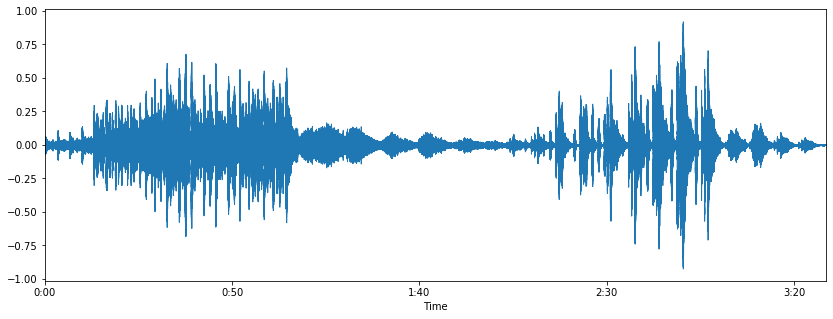

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

横轴为时间，纵轴为振幅，这是音乐在时域上的信息。

接下来对音乐在频域上的信息进行分析，首先是时变的频谱图(Spectogram)，

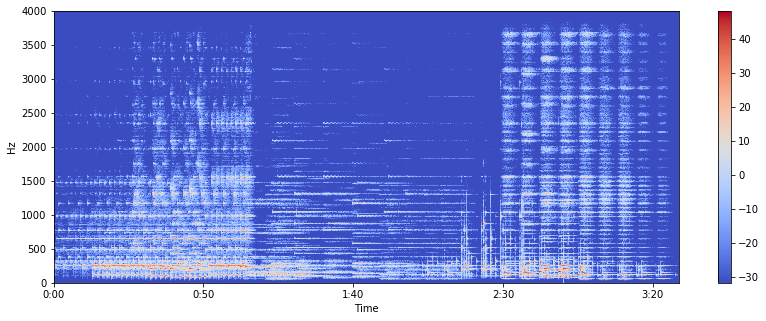

In [4]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))   # 把幅度转成分贝格式
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

这里横轴是时间，纵轴是频率，颜色则代表分贝（声音的响度），可以看到越红的地方信号音量越大

## 音乐信息的特征提取

### 过零率（Zero Crossing Rate）

过零率(Zero Crossing Rate,ZCR)是指在每帧中,语音信号通过零点(从正变为负或从负变为正)的次数。这个特征已在语音识别和音乐信息检索领域得到广泛使用，是金属声音和摇滚乐的关键特征。

回到时域图，在时间上放大，



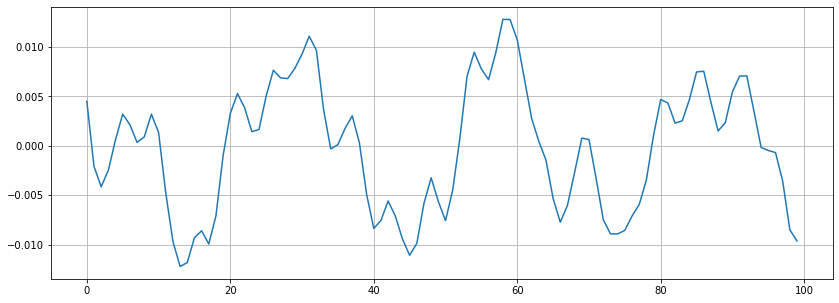

In [5]:
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

这里有13个过零点，可以通过下面的方法进行计算：

In [6]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

13


### 频谱中心（Spectral Centroid）
频谱中心代表声音的“质心”，又称为频谱一阶距。频谱中心的值越小，表明越多的频谱能量集中在低频范围内。

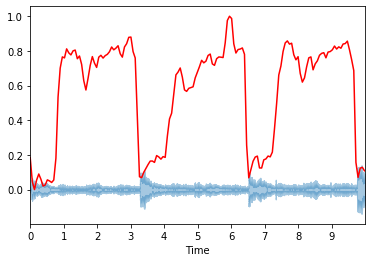

In [7]:
#spectral centroid -- centre of mass -- weighted mean of the frequencies present in the sound
import sklearn
spectral_centroids = librosa.feature.spectral_centroid(x[:80000], sr=sr)[0]
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames, sr=8000)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x[:80000], sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

这里用`x[:80000]`表示音乐的前10秒

`.spectral_centroid`来计算每一帧的频谱中心。

`.frames_to_time`将帧转换为时间，`time[i] == frame[i]`【因为stft是一个窗口(帧)一个窗口取的，和采样频率并不对应，所以有个转换】

为了更好的可视化，对频谱中心进行了归一化。

### 频谱滚降点（Spectral Rolloff）

频谱滚降点的意思大概是：比该频率低的频率的所有能量大于一定比例的整个频谱的能量，通常这个比例为0.85。

参考以下公式：

(img)[http://nladuo.github.io/2019/08/31/%E4%BD%BF%E7%94%A8Python%E5%AF%B9%E9%9F%B3%E9%A2%91%E8%BF%9B%E8%A1%8C%E7%89%B9%E5%BE%81%E6%8F%90%E5%8F%96/rolloff.png]


In [8]:
spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

ValueError: x and y must have same first dimension, but have shapes (157,) and (3260,)

### MFCC (梅尔频率倒谱系数)

MFCC是音频信号特征中最重要的一个，基本上处理音频信号就会用到。

信号的MFCC参数是一个小集合的特征（一般10-20个），它能够简洁的表示频谱的包络。

(20, 3260)


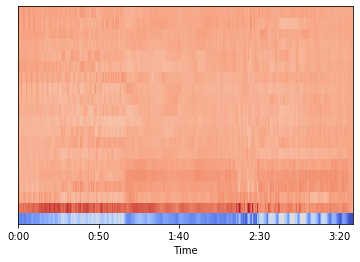

In [9]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)
#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

`.mfcc` 用来计算信号的MFCC参数。

通过打印`mfccs.shape`，可以看看每一帧里面有多少维的MFCC特征。第一个参数是mfcc参数的维度，第二个参数是帧数。

这里一共3260帧，每一帧有20维特征。

## tempogram（节奏图）

In [10]:
# Compute local onset autocorrelation
y, sr = librosa.load(librosa.util.example_audio_file())
hop_length = 512
oenv = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr,
                                       hop_length=hop_length)
# Compute global onset autocorrelation
ac_global = librosa.autocorrelate(oenv, max_size=tempogram.shape[0])
ac_global = librosa.util.normalize(ac_global)
# Estimate the global tempo for display purposes
tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sr,
                            hop_length=hop_length)[0]

In [11]:
print(tempogram.shape)
print(ac_global.shape)

(384, 2647)
(384,)


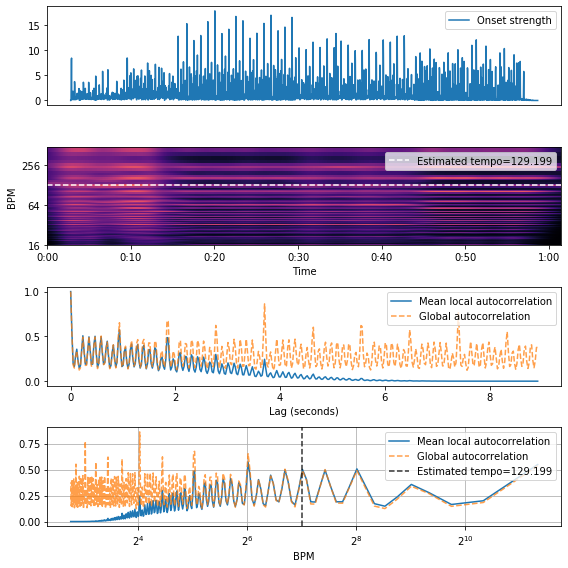

In [14]:
import numpy as np
plt.figure(figsize=(8, 8))
plt.subplot(4, 1, 1)
plt.plot(oenv, label='Onset strength')
plt.xticks([])
plt.legend(frameon=True)
plt.axis('tight')
plt.subplot(4, 1, 2)
# We'll truncate the display to a narrower range of tempi
librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length,
                         x_axis='time', y_axis='tempo')
plt.axhline(tempo, color='w', linestyle='--', alpha=1,
             label='Estimated tempo={:g}'.format(tempo))
plt.legend(frameon=True, framealpha=0.75)
plt.subplot(4, 1, 3)
x = np.linspace(0, tempogram.shape[0] * float(hop_length) / sr,
                 num=tempogram.shape[0])
plt.plot(x, np.mean(tempogram, axis=1), label='Mean local autocorrelation')
plt.plot(x, ac_global, '--', alpha=0.75, label='Global autocorrelation')
plt.xlabel('Lag (seconds)')
plt.axis('tight')
plt.legend(frameon=True)
plt.subplot(4,1,4)
# We can also plot on a BPM axis
freqs = librosa.tempo_frequencies(tempogram.shape[0], hop_length=hop_length, sr=sr)
plt.semilogx(freqs[1:], np.mean(tempogram[1:], axis=1),
              label='Mean local autocorrelation', basex=2)
plt.semilogx(freqs[1:], ac_global[1:], '--', alpha=0.75,
              label='Global autocorrelation', basex=2)
plt.axvline(tempo, color='black', linestyle='--', alpha=.8,
             label='Estimated tempo={:g}'.format(tempo))
plt.legend(frameon=True)
plt.xlabel('BPM')
plt.axis('tight')
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()